# XAI - Classification and Object Detection
## Visualizations and experiments

-Ankur Bhatia <br>
[bhatia.ankur24@gmail.com](bhatia.ankur24@gmail.com) <br>
[https://ankurbhatia24.github.io/](https://ankurbhatia24.github.io/)

In [1]:
%tensorflow_version 1.x
import imagenet_classes_to_names
from tensorflow.keras.applications.vgg19 import VGG19
from keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.models import Model
import numpy as np

import warnings
warnings.filterwarnings('ignore')

TensorFlow 1.x selected.


Using TensorFlow backend.


## We will be using the Keras Vis Library for visualizing the Grad Cam and Saliency Maps
## by Raghavendra Kotikalapudi - https://github.com/raghakot/keras-vis

In [2]:
pip install https://github.com/raghakot/keras-vis/archive/master.zip

  Using cached https://github.com/raghakot/keras-vis/archive/master.zip
  Created wheel for keras-vis: filename=keras_vis-0.5.0-py2.py3-none-any.whl size=30855 sha256=b5829eb109f19d94b94c9bdafb53eb7001ff9d9189e87f1e5e13c5e0a4a86247
  Stored in directory: /tmp/pip-ephem-wheel-cache-yzy7l8mg/wheels/7e/91/e5/9fdb0f2f5fa5d9f402c6fbfaf015aadbe3dba024ede6532727
Successfully built keras-vis


In [ ]:
import matplotlib.pyplot as plt
from tensorflow import keras
from vis.visualization import visualize_saliency, visualize_cam, overlay
from vis.utils import utils
from keras import activations
import matplotlib.image as mpimg
import scipy.ndimage as ndimage
import matplotlib.cm as cm

import tempfile
from keras.models import load_model
import os
import cv2
import random

### We will use the pretrained VGG19 model for evaluating the features of the images using the imagenet weights.
### Keras provides us an easy way to do transfer learning.

In [4]:
image_dir = "test_images/"
model = VGG19(weights='imagenet')
# model = VGG16(weights = 'imagenet')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


### The last dense layer: predictions (1000 labels for 1000 classes of imagenet)
### We will be using this layer to compute the gradients back to project on the image to find the saliency maps (https://arxiv.org/abs/1312.6034) and Grad Cam (https://arxiv.org/abs/1610.02391)

In [5]:
model.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

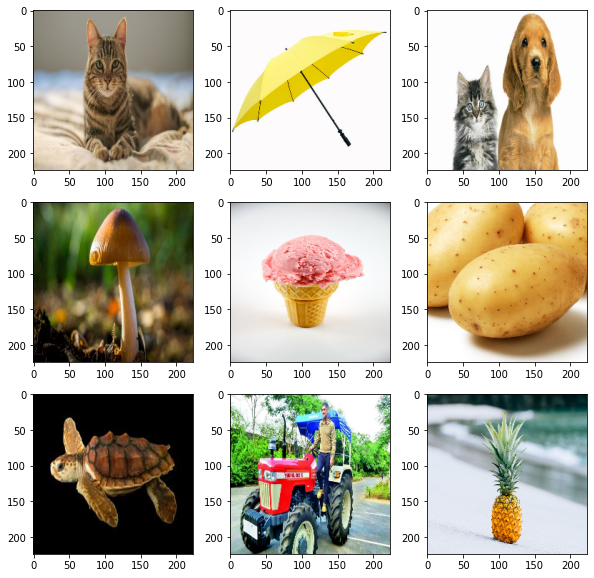

In [6]:
images = ["cat.jpg", 
          "umbrella.jpg", 
          "dogs_and_cats.jpeg", 
          "mushroom.jpg", 
          "ice_cream.jpg",
          "potato.jpg",
          "turtle.jpeg",
          "tractor.jpeg",
          "pineapple.jpg"]

plt.figure(figsize = (10,10))
for i, image in enumerate(images):
    img = cv2.imread(image_dir + image)
    img = cv2.resize(img, (224, 224), interpolation = cv2.INTER_CUBIC) #resizing to 224 because VGG accepts inputs of this size
    plt.subplot(3, 3, i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

### Functions for image augmentation using OpenCV
### https://towardsdatascience.com/complete-image-augmentation-in-opencv-31a6b02694f5

In [7]:
def horizontal_shift(img, ratio=0.0):
    if ratio > 1 or ratio < 0:
        print('Value should be less than 1 and greater than 0')
        return img
    ratio = random.uniform(-ratio, ratio)
    h, w = img.shape[:2]
    to_shift = w*ratio
    if ratio > 0:
        img = img[:, :int(w-to_shift), :]
    if ratio < 0:
        img = img[:, int(-1*to_shift):, :]
    img = fill(img, h, w)
    return img
def vertical_shift(img, ratio=0.0):
    if ratio > 1 or ratio < 0:
        print('Value should be less than 1 and greater than 0')
        return img
    ratio = random.uniform(-ratio, ratio)
    h, w = img.shape[:2]
    to_shift = h*ratio
    if ratio > 0:
        img = img[:int(h-to_shift), :, :]
    if ratio < 0:
        img = img[int(-1*to_shift):, :, :]
    img = fill(img, h, w)
    return img
def brightness(img, low, high):
    value = random.uniform(low, high)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hsv = np.array(hsv, dtype = np.float64)
    hsv[:,:,1] = hsv[:,:,1]*value
    hsv[:,:,1][hsv[:,:,1]>255]  = 255
    hsv[:,:,2] = hsv[:,:,2]*value 
    hsv[:,:,2][hsv[:,:,2]>255]  = 255
    hsv = np.array(hsv, dtype = np.uint8)
    img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return img
def zoom(img, value):
    if value > 1 or value < 0:
        print('Value for zoom should be less than 1 and greater than 0')
        return img
    value = random.uniform(value, 1)
    h, w = img.shape[:2]
    h_taken = int(value*h)
    w_taken = int(value*w)
    h_start = random.randint(0, h-h_taken)
    w_start = random.randint(0, w-w_taken)
    img = img[h_start:h_start+h_taken, w_start:w_start+w_taken, :]
    img = fill(img, h, w)
    return img

def horizontal_flip(img, flag):
    if flag:
        return cv2.flip(img, 1)
    else:
        return img

def vertical_flip(img, flag):
    if flag:
        return cv2.flip(img, 0)
    else:
        return img

def rotation(img, angle):
    angle = int(random.uniform(-angle, angle))
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((int(w/2), int(h/2)), angle, 1)
    img = cv2.warpAffine(img, M, (w, h))
    return img
           
def fill(img, h, w):
    img = cv2.resize(img, (h, w), cv2.INTER_CUBIC)
    return img

### 1. Converting the activation of last layer of the model from softmax to linear since gradients needs to be calculated on these layers. 
### 2. The model is again saved and loaded to make the changes active

In [8]:
# For performing Grad-Cam and building saliency_map
layer_idx = utils.find_layer_idx(model, 'predictions')
model.layers[layer_idx].activation = activations.linear
model_path = os.path.join(tempfile.gettempdir(), next(tempfile._get_candidate_names()) + '.h5')
model.save(model_path)
model = keras.models.load_model(model_path)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


### Functions for computing the saliency maps and Grad Cam.
### Please refer to the doc for understanding the methods and explainations for the results

In [ ]:
def show_saliency_map(model, layer_idx, filter_indices, img, grad_modifier="absolute"):
    grads = visualize_saliency(model, layer_idx, filter_indices=filter_indices, seed_input = img, grad_modifier=grad_modifier)
    gaus = ndimage.gaussian_filter(grads[:,:], sigma = 5)
    # plt.imshow(img)
    # plt.imshow(gaus, alpha = .6)
    return gaus

def show_gradcam(model, layer_idx, filter_indices, img, grad_modifier="absolute"):
    penultimate_layer_idx = utils.find_layer_idx(model, 'block5_conv1')
    grads = visualize_cam(model, layer_idx, 
                        filter_indices=filter_indices, seed_input = img,
                        penultimate_layer_idx = penultimate_layer_idx,
                        grad_modifier=grad_modifier)
    # Overlay the heatmap onto original image.    
    jet_heatmap = np.uint8(cm.jet(grads)[..., :3] * 255)
    return overlay(jet_heatmap, img)

### Function for displaying the augmented images, their Grad Cam and Saliency Map

In [28]:
def perform_augmentations(image, img, save = False):

    ax1 = plt.subplot(3, 7, 1 )
    hs = horizontal_shift(img, 0.4)
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(np.argmax(model.predict(hs.reshape(1, 224, 224, 3)))))
    ax1.imshow(cv2.cvtColor(hs, cv2.COLOR_BGR2RGB))
    if(save):
        cv2.imwrite("hs_" + image, hs)


    ax2 = plt.subplot(3, 7, 2)
    vs = vertical_shift(img, 0.4)
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(np.argmax(model.predict(vs.reshape(1, 224, 224, 3)))))
    ax2.imshow(cv2.cvtColor(vs, cv2.COLOR_BGR2RGB))
    if(save):
        cv2.imwrite("vs_" + image, img)


    ax3 = plt.subplot(3, 7, 3 )
    rot = rotation(img, 30)
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(np.argmax(model.predict(rot.reshape(1, 224, 224, 3)))))
    ax3.imshow(cv2.cvtColor(rot, cv2.COLOR_BGR2RGB))
    if(save):
        cv2.imwrite("rot_" + image, rot)


    ax4 = plt.subplot(3, 7, 4 )
    vf = vertical_flip(img, True)
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(np.argmax(model.predict(vf.reshape(1, 224, 224, 3)))))
    ax4.imshow(cv2.cvtColor(vf, cv2.COLOR_BGR2RGB))
    if(save):
        cv2.imwrite("vf_" + image, vf)


    ax5 = plt.subplot(3, 7, 5 )
    hf = horizontal_flip(img, True)
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(np.argmax(model.predict(hf.reshape(1, 224, 224, 3)))))
    ax5.imshow(cv2.cvtColor(hf, cv2.COLOR_BGR2RGB))
    if(save):
        cv2.imwrite("hf_" + image, hf)


    ax6 = plt.subplot(3, 7, 6 )
    zm = zoom(img, 0.5)
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(np.argmax(model.predict(zm.reshape(1, 224, 224, 3)))))
    ax6.imshow(cv2.cvtColor(zm, cv2.COLOR_BGR2RGB))
    if(save):
        cv2.imwrite("zoom_" + image, zm)


    ax7 = plt.subplot(3, 7, 7)
    bright = brightness(img, 0.5, 3)
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(np.argmax(model.predict(bright.reshape(1, 224, 224, 3)))))
    ax7.imshow(cv2.cvtColor(bright, cv2.COLOR_BGR2RGB))
    if(save):
        cv2.imwrite("bright_" + image, bright)

    ax8 = plt.subplot(3, 7, 8 )
    class_pred = np.argmax(model.predict(hs.reshape(1, 224, 224, 3)))
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
    grads = show_gradcam(model, layer_idx, class_pred, hs)
    ax8.imshow(grads)
    
    ax9 = plt.subplot(3, 7, 9)
    class_pred = np.argmax(model.predict(vs.reshape(1, 224, 224, 3)))
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
    grads = show_gradcam(model, layer_idx, class_pred, vs)
    ax9.imshow(grads)

    ax10 = plt.subplot(3, 7, 10 )
    class_pred = np.argmax(model.predict(rot.reshape(1, 224, 224, 3)))
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
    grads = show_gradcam(model, layer_idx, class_pred, rot)
    ax10.imshow(grads)

    ax11 = plt.subplot(3, 7, 11)
    class_pred = np.argmax(model.predict(vf.reshape(1, 224, 224, 3)))
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
    grads = show_gradcam(model, layer_idx, class_pred, vf)
    ax11.imshow(grads)

    ax12 = plt.subplot(3, 7, 12)
    class_pred = np.argmax(model.predict(hf.reshape(1, 224, 224, 3)))
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
    grads = show_gradcam(model, layer_idx, class_pred, hf)
    ax12.imshow(grads)

    ax13 = plt.subplot(3, 7, 13 )
    class_pred = np.argmax(model.predict(zm.reshape(1, 224, 224, 3)))
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
    grads = show_gradcam(model, layer_idx, class_pred, zm)
    ax13.imshow(grads)

    ax14 = plt.subplot(3, 7, 14)
    class_pred = np.argmax(model.predict(bright.reshape(1, 224, 224, 3)))
    plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
    grads = show_gradcam(model, layer_idx, class_pred, bright)
    ax14.imshow(grads)

    ax15 = plt.subplot(3, 7, 15)
    gaus = show_saliency_map(model, layer_idx, None, hs)
    # ax15.imshow(hs)
    ax15.imshow(gaus)

    ax16 = plt.subplot(3, 7, 16)
    gaus = show_saliency_map(model, layer_idx, None, vs)
    # ax15.imshow(vs)
    ax16.imshow(gaus)

    ax17 = plt.subplot(3, 7, 17)
    gaus = show_saliency_map(model, layer_idx, None, rot)
    # ax15.imshow(rot)
    ax17.imshow(gaus)

    ax18 = plt.subplot(3, 7, 18)
    gaus = show_saliency_map(model, layer_idx, None, vf)
    # ax15.imshow(vf)
    ax18.imshow(gaus)

    ax19 = plt.subplot(3, 7, 19)
    gaus = show_saliency_map(model, layer_idx, None, hf)
    # ax15.imshow(hf)
    ax19.imshow(gaus)

    ax20 = plt.subplot(3, 7, 20)
    gaus = show_saliency_map(model, layer_idx, None, zm)
    # ax15.imshow(zm)
    ax20.imshow(gaus)

    ax21 = plt.subplot(3, 7, 21)
    gaus = show_saliency_map(model, layer_idx, None, bright)
    # ax15.imshow(bright)
    ax21.imshow(gaus)

PLOTTING VARIOUS AUGMENTATIONS OF THE IMAGES. <br>
**IMAGENET LABELS ARE ON THE Y AXIS OF EACH IMAGE**

Images are plotted as:
ORIGINAL IMAGE   --------------------      GRAD CAM  ---------------------       SALIENCY MAP
1. The first row shows the original image with its grad cam and saliency map respectively.
2. Following 3 rows are augmentation performed with their corresponding grad cams and saliency maps.

We can see that the augmentations which have caused the vgg19 to predict a different label also causes different regions of high internsity in gradcam or the saliency maps (not much clear from this).

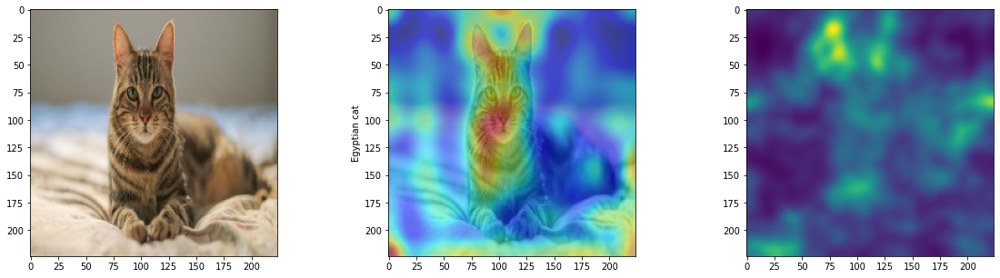

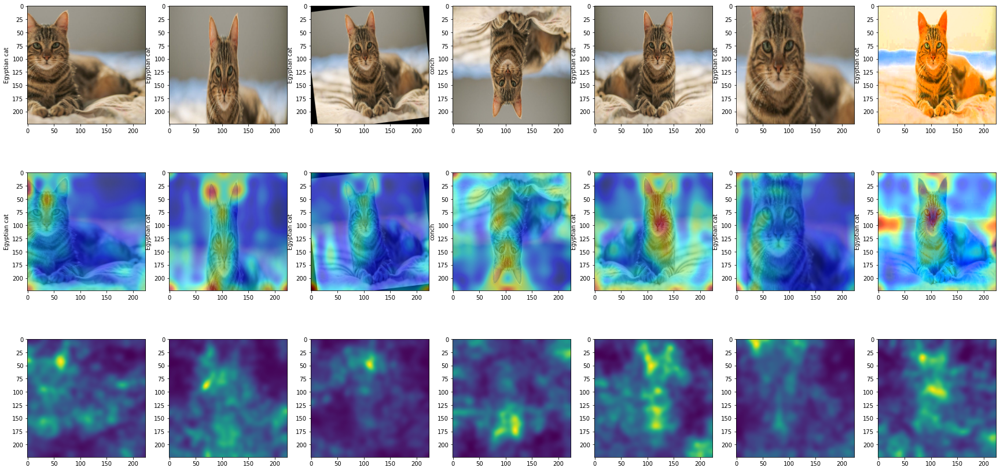

In [51]:
img = cv2.imread(image_dir + images[0])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

### Here we can see that the major features (see the brightest regions in the saliency map/ grad cam) that contributes to the classification are cats ears and some middel portion of the cat's face (including the moustache).

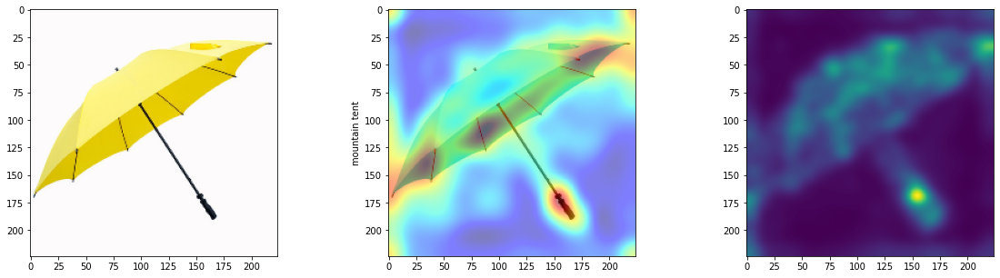

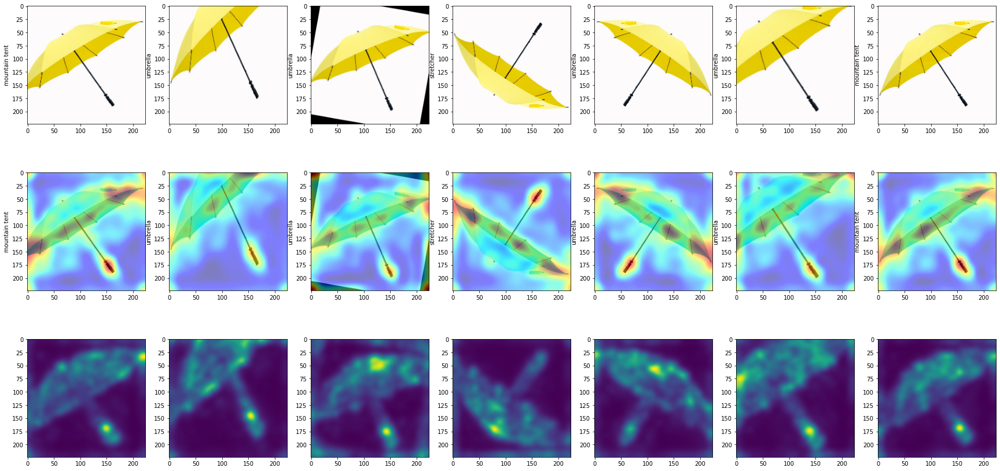

In [41]:
img = cv2.imread(image_dir + images[1])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

### The main contributing features are the handle of the umbrella and the corners of it.

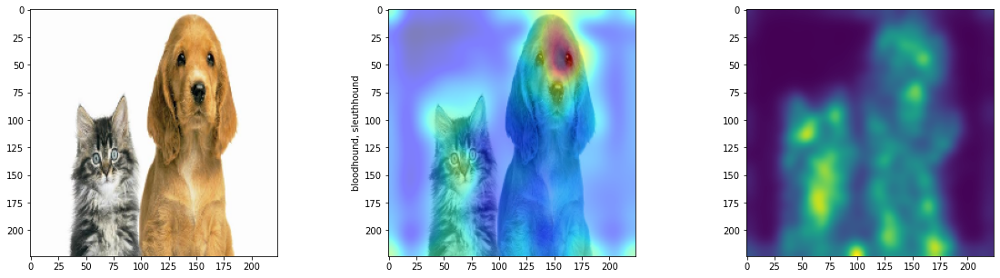

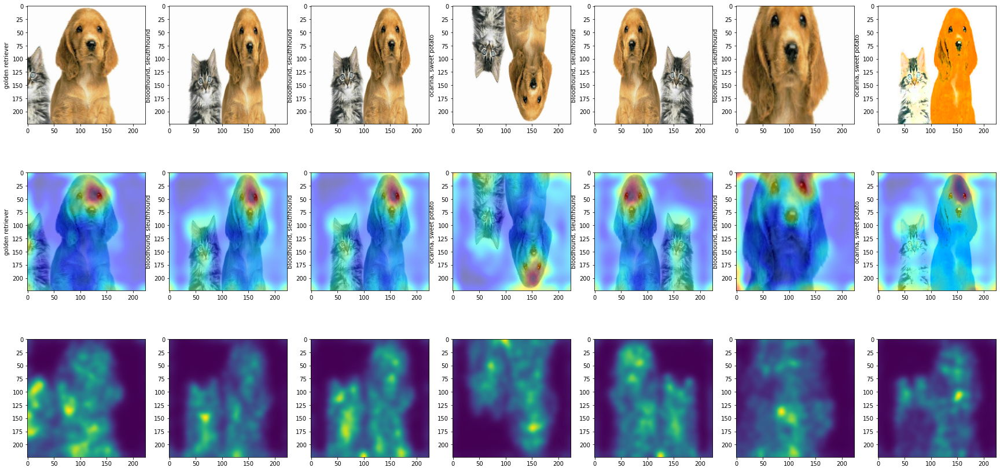

In [42]:
img = cv2.imread(image_dir + images[2])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

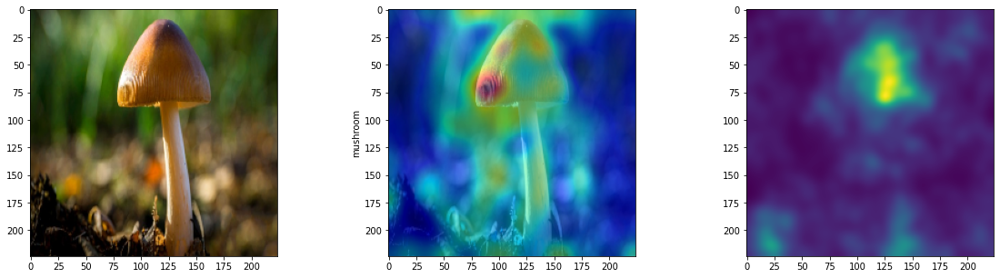

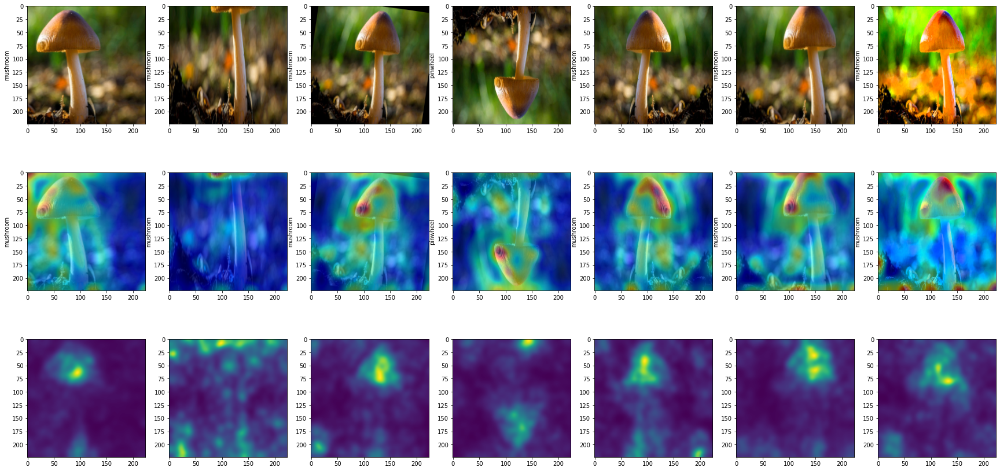

In [43]:
img = cv2.imread(image_dir + images[3])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

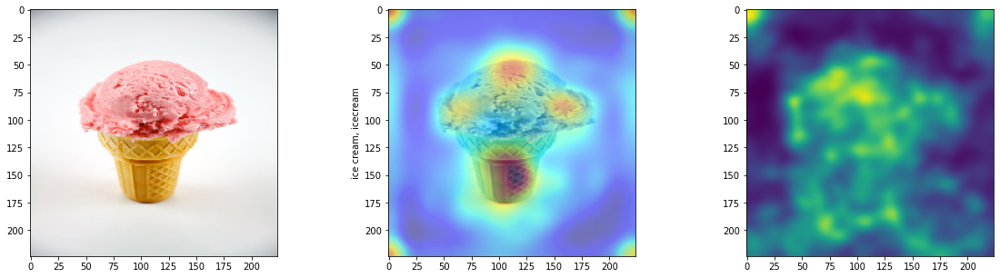

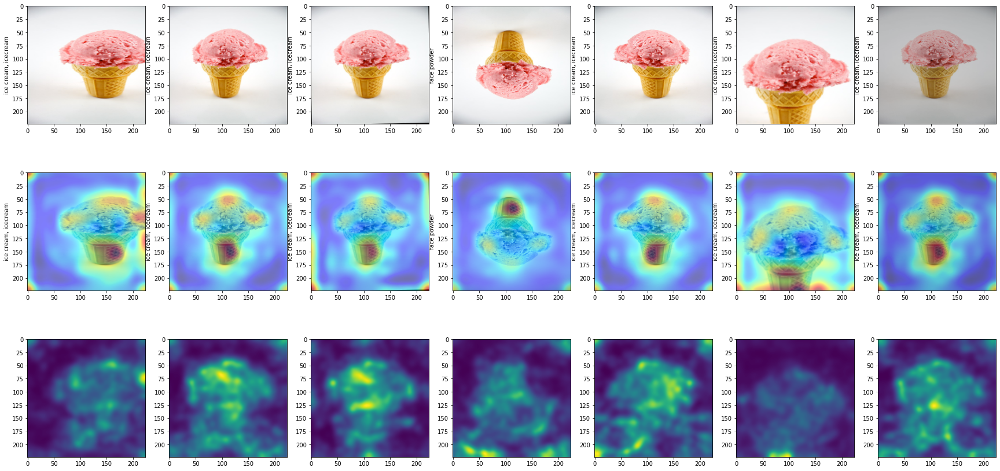

In [44]:
img = cv2.imread(image_dir + images[4])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

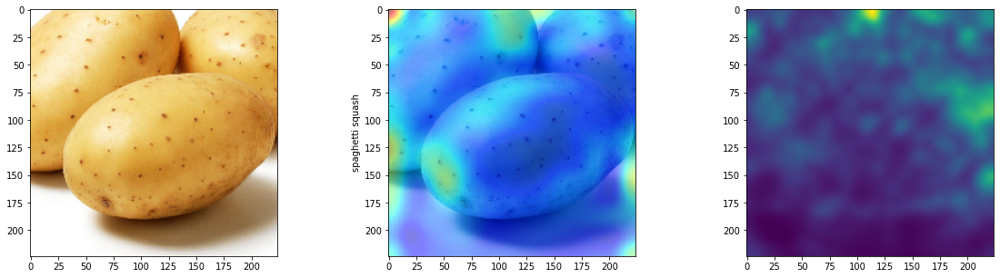

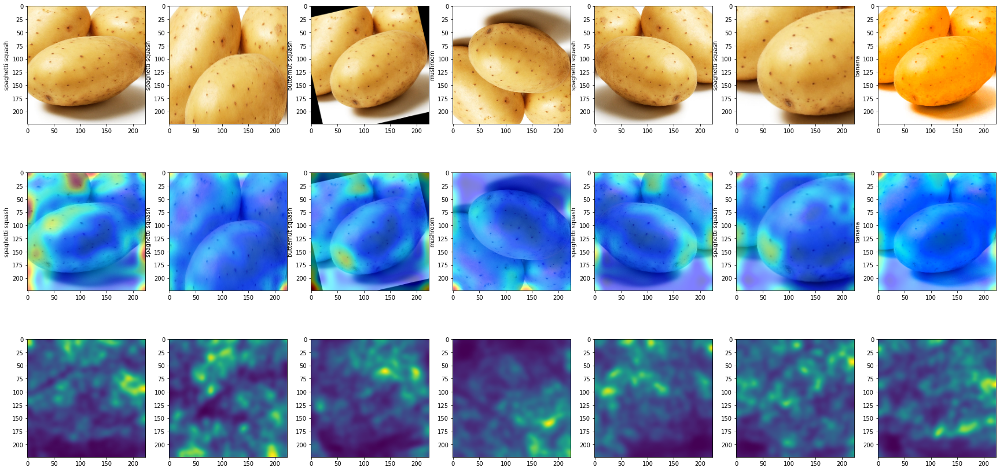

In [45]:
img = cv2.imread(image_dir + images[5])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

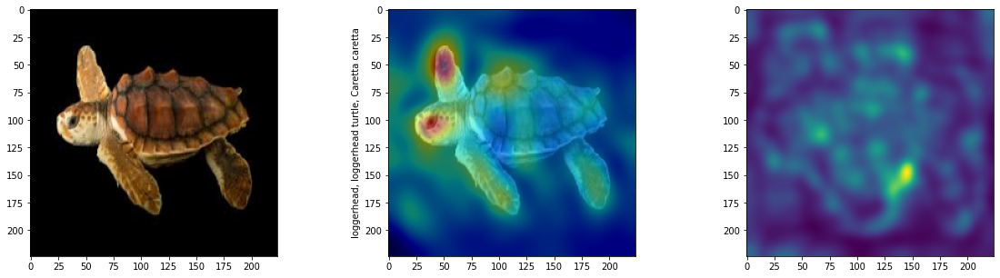

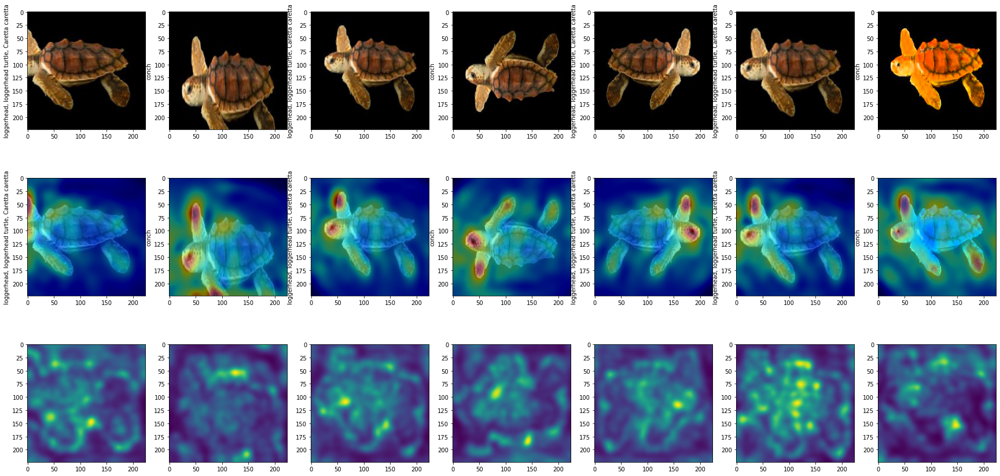

In [46]:
img = cv2.imread(image_dir + images[6])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

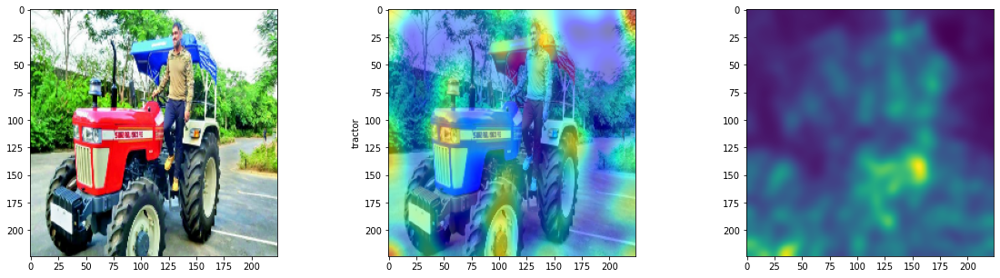

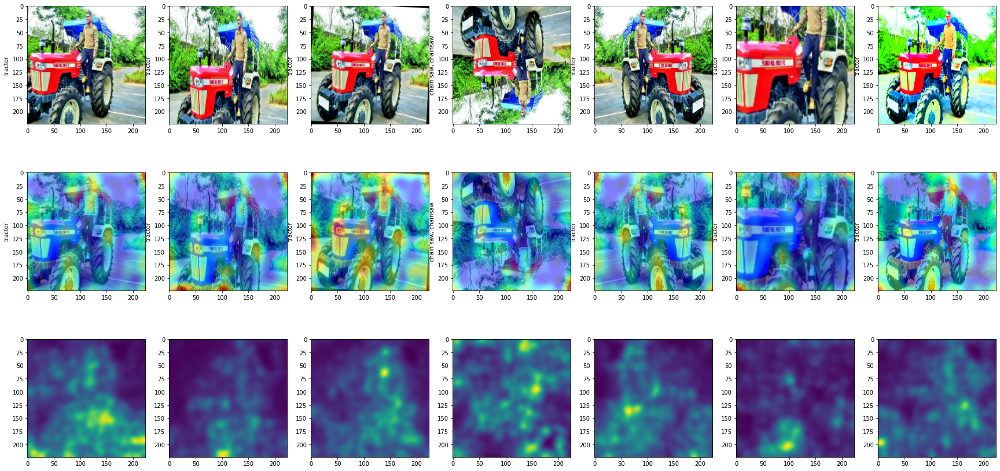

In [47]:
img = cv2.imread(image_dir + images[7])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

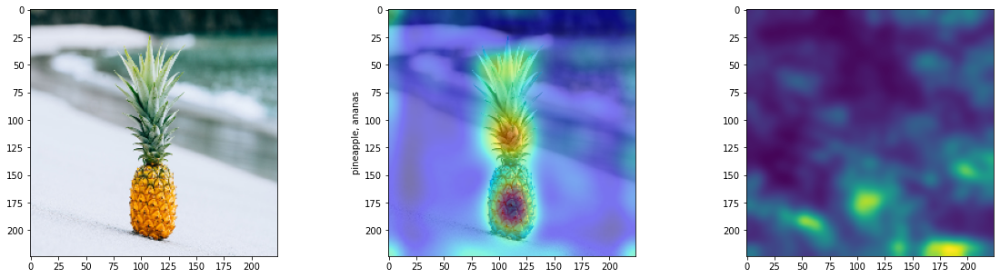

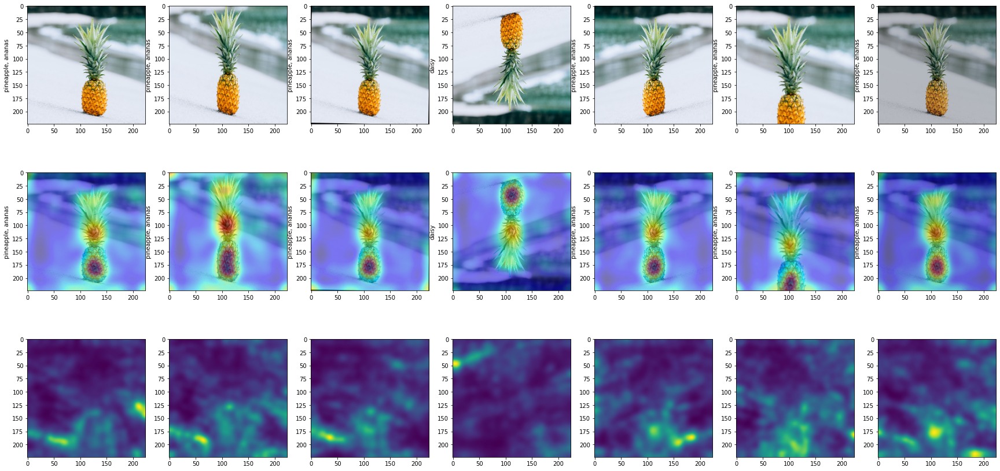

In [53]:
img = cv2.imread(image_dir + images[8])
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)


plt.figure(figsize = (30, 15))
perform_augmentations(image, img, save = False)

In [49]:
#apply vgg on all images to predict classes
print(imagenet_classes_to_names.imagenet_classes_to_names(np.argmax(model.predict(img.reshape(1, 224, 224, 3)))))
# np.argmax(model.predict(img.reshape(1, 224, 224, 3)))

pineapple, ananas


## *Checking the predictions on the images after masking the hot images from the gradcam.

1. Visualizing the gradcams, the high intensity regions have been explicitly been covered with black mask.
2. We can see that the labels predicted by the vgg19, since the major regions that contributes to the classification have been masked, are incorrect.
3. This shows that grad cam method helps us understand the features that are contributing to the classification.

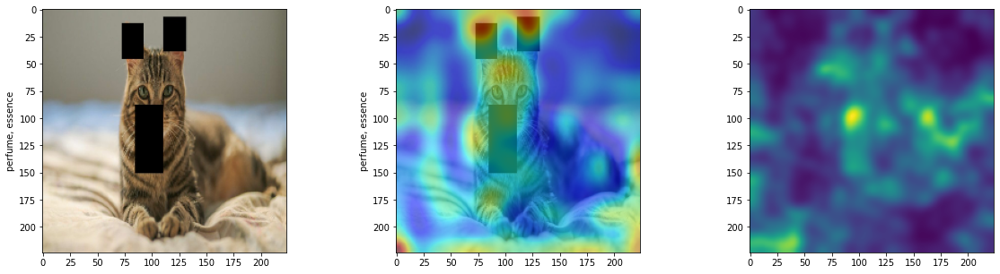

In [74]:
images = ["cat_masked.jpg", "umbrella_masked.jpg", "mushroom_masked.jpg", "cat_and_dog_masked.jpg"]

#change the activation of the final layer again to softmax
model.layers[layer_idx].activation = activations.softmax

plt.figure(figsize = (20, 5))

img = cv2.imread(image_dir + images[0])
img = fill(img, 224, 224)

plt.subplot(1, 3, 1)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)

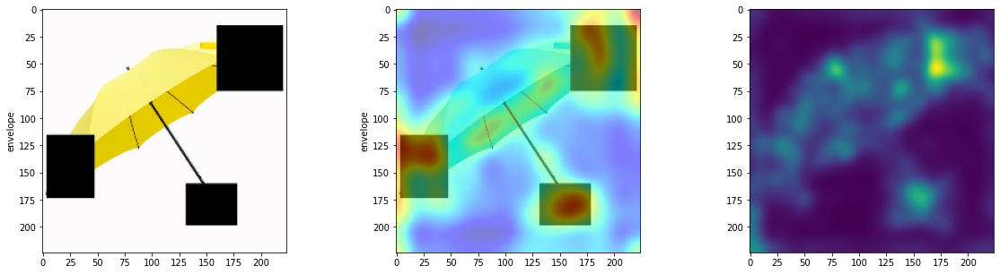

In [75]:
plt.figure(figsize = (20, 5))

img = cv2.imread(image_dir + images[1])
img = fill(img, 224, 224)

plt.subplot(1, 3, 1)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)

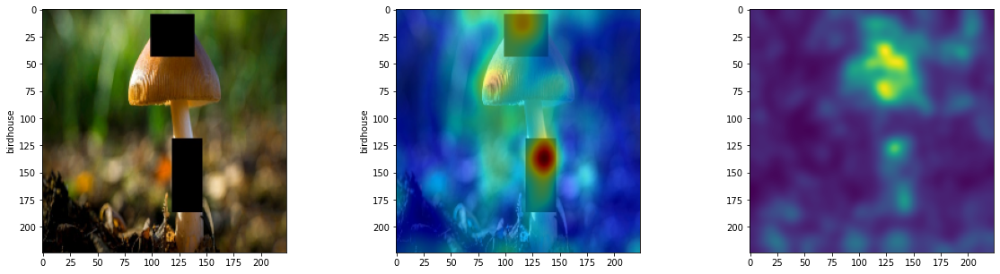

In [65]:
plt.figure(figsize = (20, 5))

img = cv2.imread(image_dir + images[2])
img = fill(img, 224, 224)

plt.subplot(1, 3, 1)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)

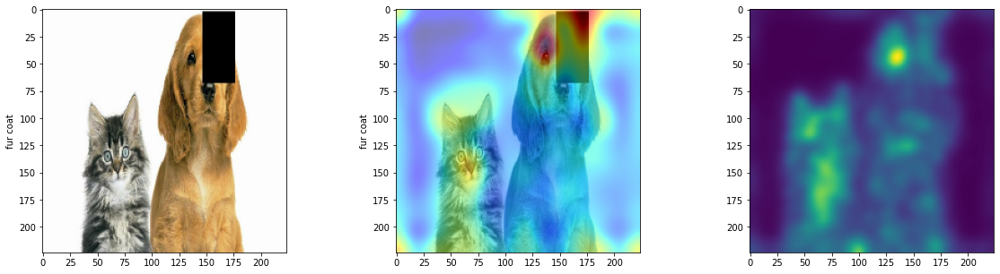

In [72]:
plt.figure(figsize = (20, 5))

img = cv2.imread(image_dir + images[3])
img = fill(img, 224, 224)

plt.subplot(1, 3, 1)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
grads = show_gradcam(model, layer_idx, class_pred, img)
plt.imshow(grads)

plt.subplot(1, 3, 3)
gaus = show_saliency_map(model, layer_idx, None, img)
plt.imshow(gaus)

### Understanding the features
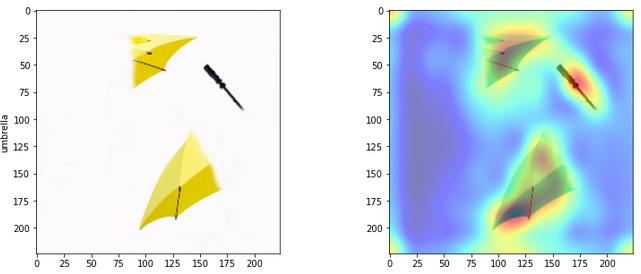

To check the accuracy of this, I just edited out the unimportant part of the image and tested the model for the leftover image.

Still, the model predicted an umbrella - which shows that the model is predicting only from the selected important regions. 

Also, as we know that the convolutions are spatially invariant - so changing the localization of the umbrella (containing the same parts as above) also produces the correct label. It recognizes the umbrella from the features it requires.


In [ ]:
img = cv2.imread(image_dir + "umbrella_generated_3.jpeg")
img = fill(img, 224, 224)

plt.figure(figsize = (20, 5))
plt.subplot(1, 3, 1)
class_pred = np.argmax(model.predict(img.reshape(1, 224, 224, 3)))
plt.ylabel(imagenet_classes_to_names.imagenet_classes_to_names(class_pred))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)

grads = show_gradcam(model, 25, class_pred, img)
plt.imshow(grads)